In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import pickle
%matplotlib inline

In [2]:
import os
os.listdir("test_images/")

['straight_lines1.jpg',
 'straight_lines2.jpg',
 'test1.jpg',
 'test2.jpg',
 'test3.jpg',
 'test4.jpg',
 'test5.jpg',
 'test6.jpg']

# Plot The Test Images

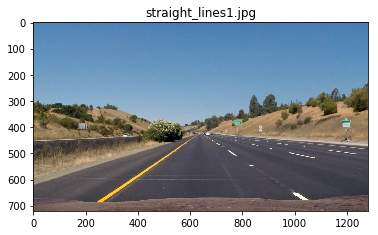

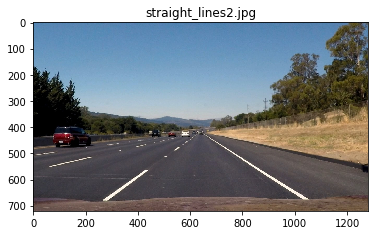

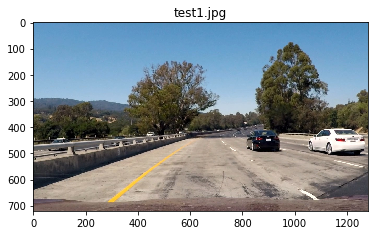

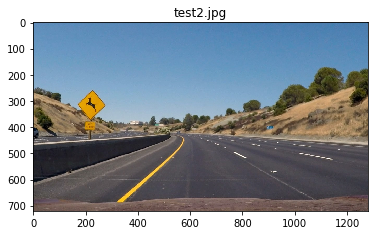

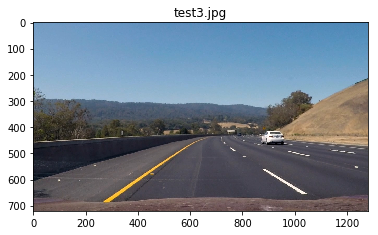

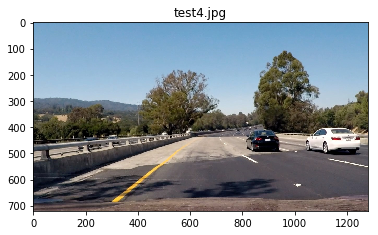

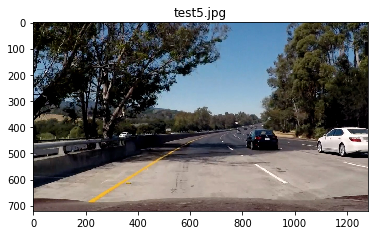

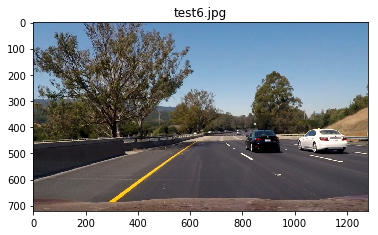

In [3]:
## load the test images
images = os.listdir("test_images/")
plt.figure()
for image in images :
    img = mpimg.imread("test_images/" + image)
    #plot the image
    plt.figure()
    plt.title(image)
    plt.imshow(img)

# Undistort The Image

In [4]:
## load the calibriation matrix.
dist_pickle = pickle.load( open( "calibration_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]
print(mtx)
print(dist)

[[  1.15396093e+03   0.00000000e+00   6.69705357e+02]
 [  0.00000000e+00   1.14802496e+03   3.85656234e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
[[ -2.41017956e-01  -5.30721173e-02  -1.15810355e-03  -1.28318856e-04
    2.67125290e-02]]


In [5]:
def undistort(img):
    " Undistor the Orignial image"
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

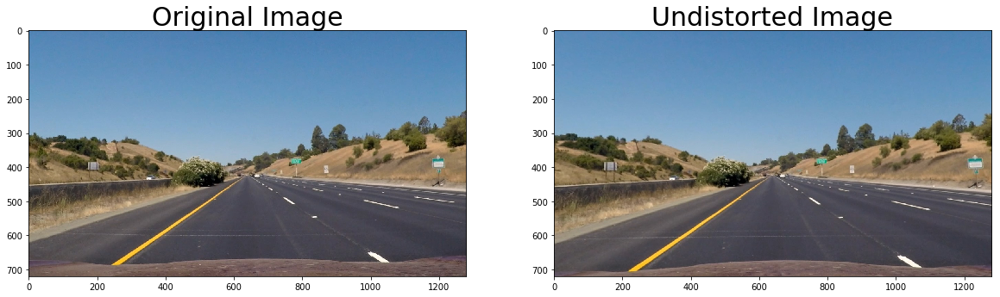

In [6]:
## Choose the first iamge to test the undistor function 
image = mpimg.imread("test_images/"+ images[0])
undist = undistort(image)
# mpimg.imsave("undist_" + images[0],undist)
mpimg.imsave(os.path.join('output_images', "undist_" + images[0]), undist)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)

# Perspective Transform

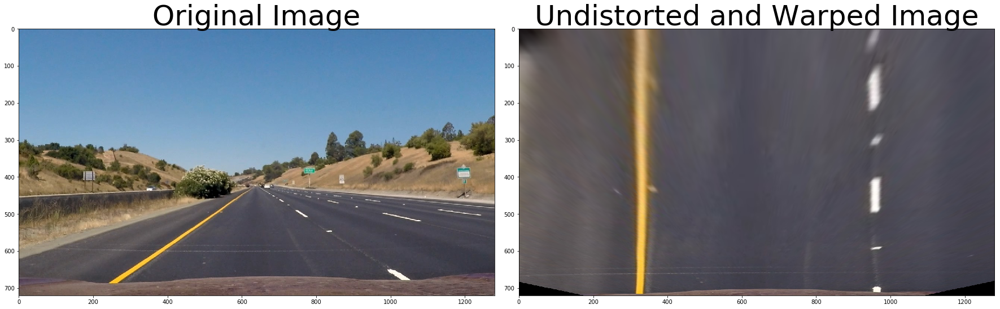

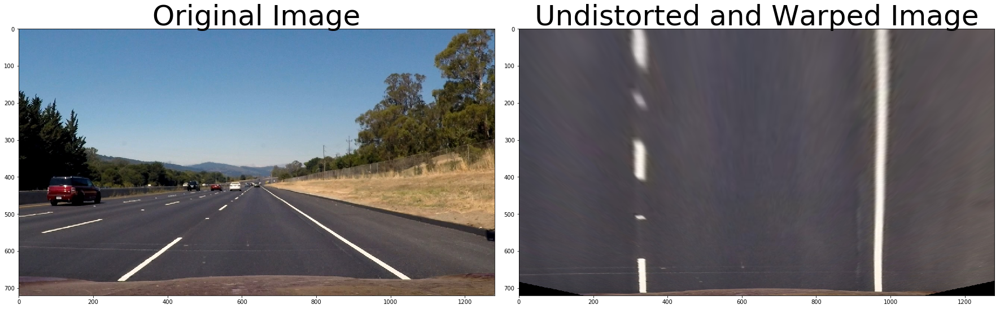

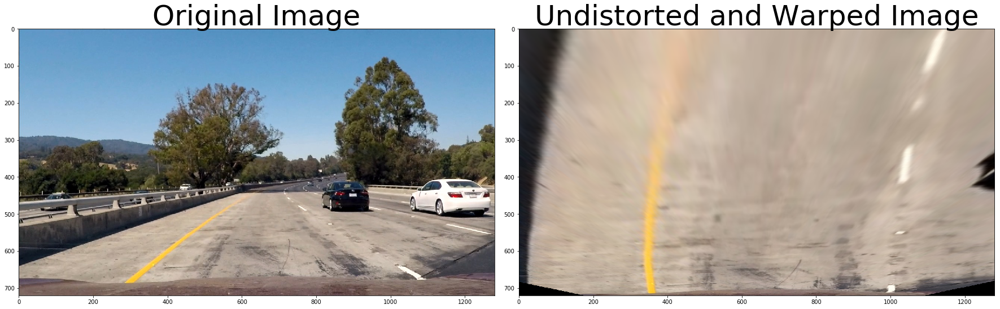

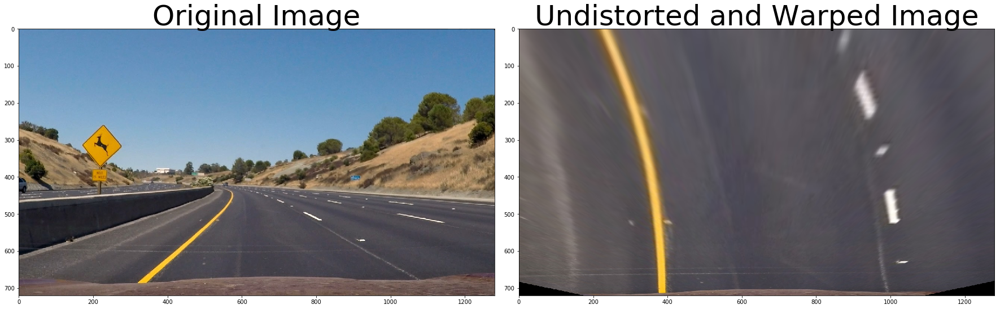

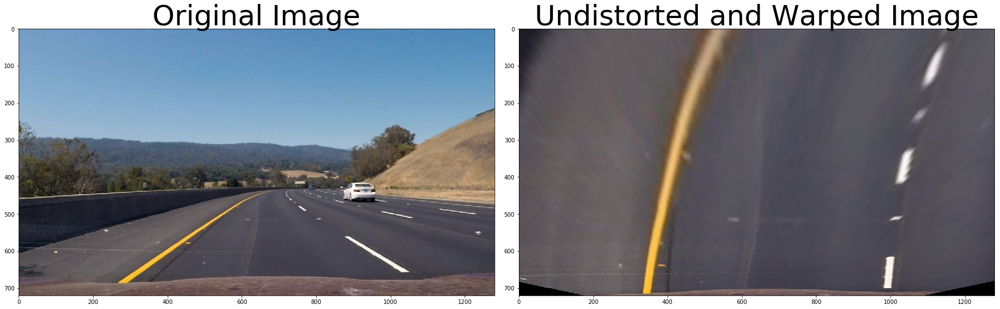

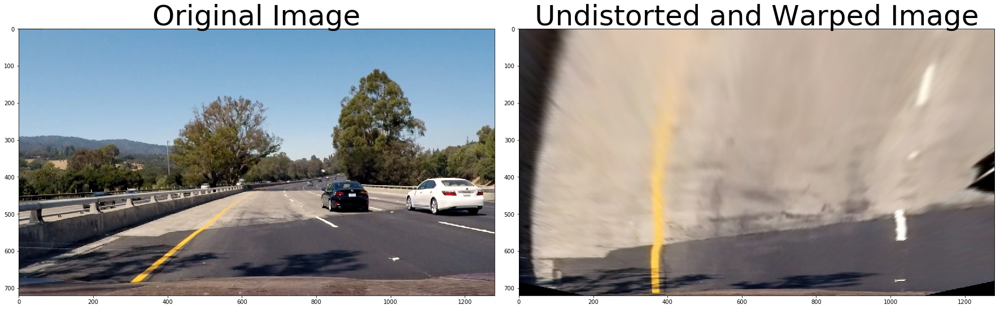

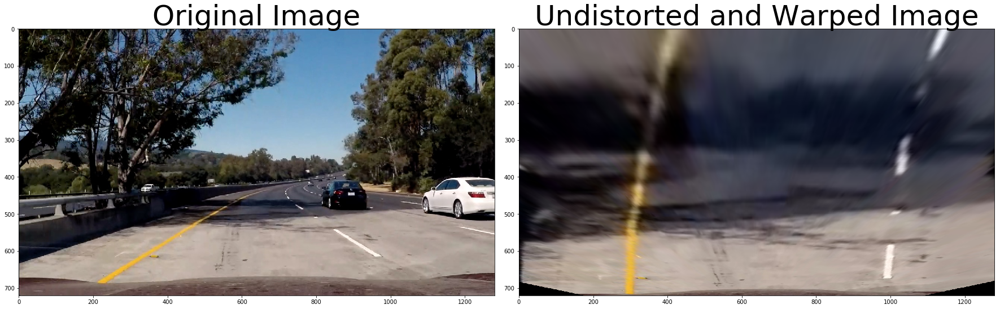

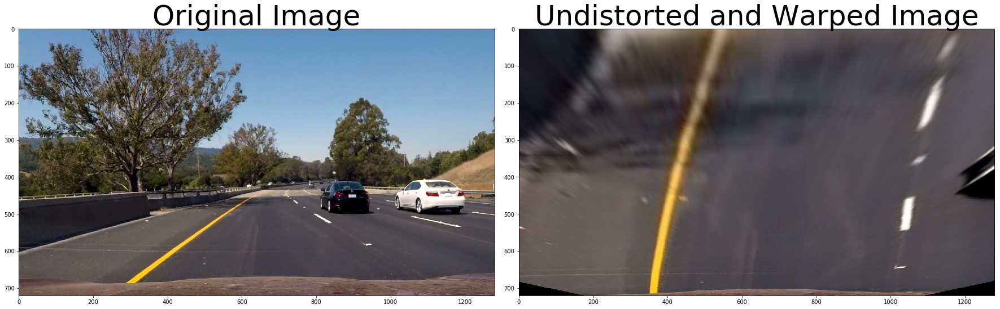

In [7]:
def unwarped(img, undist):  
    img_size = (img.shape[1], img.shape[0])
    w,h = 1280,720
    x,y = 0.5*w, 0.8*h
    src = np.float32([[200./1280*w,720./720*h],
                  [453./1280*w,547./720*h],
                  [835./1280*w,547./720*h],
                  [1100./1280*w,720./720*h]])
    dst = np.float32([[(w-x)/2.,h],
                  [(w-x)/2.,0.82*h],
                  [(w+x)/2.,0.82*h],
                  [(w+x)/2.,h]])
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv

for image in images :
    img = mpimg.imread("test_images/" + image)
    undist = undistort(img)
    unwarp, _, _ = unwarped(img, undist)
    mpimg.imsave(os.path.join('output_images', "unwarp_" + image), unwarp)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(unwarp,cmap='gray')
    ax2.set_title('Undistorted and Warped Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Thresh Image

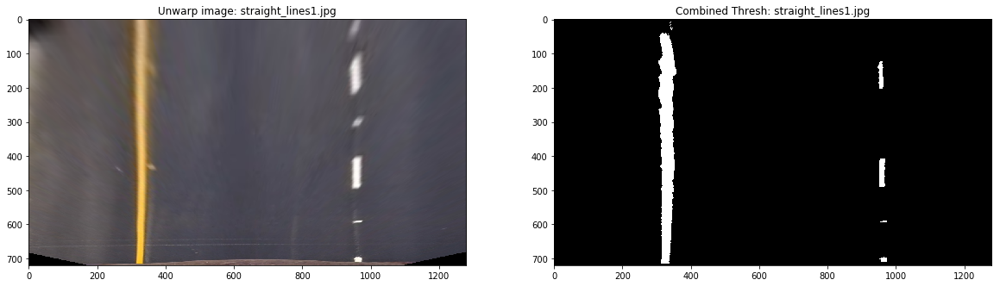

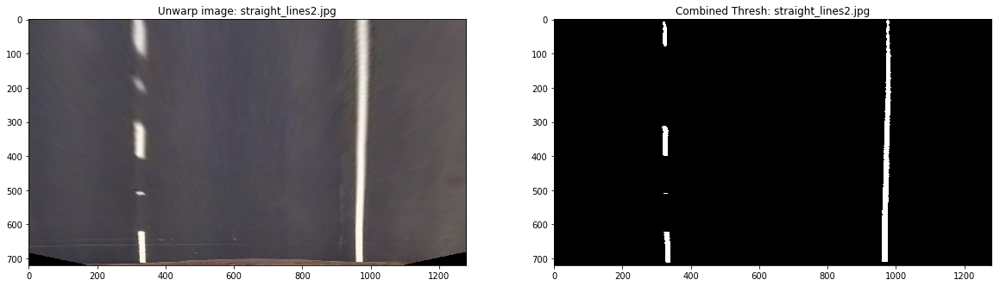

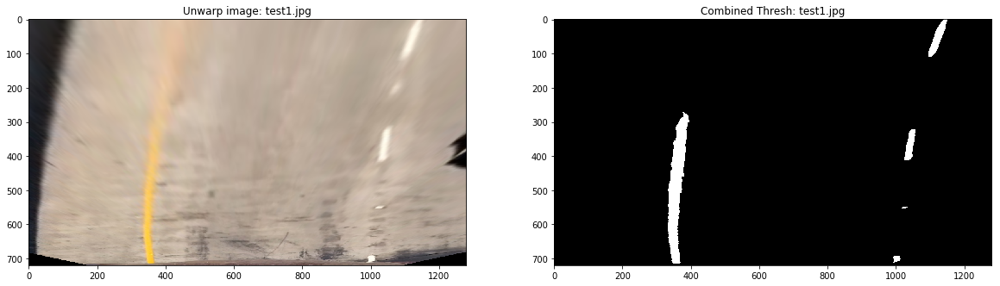

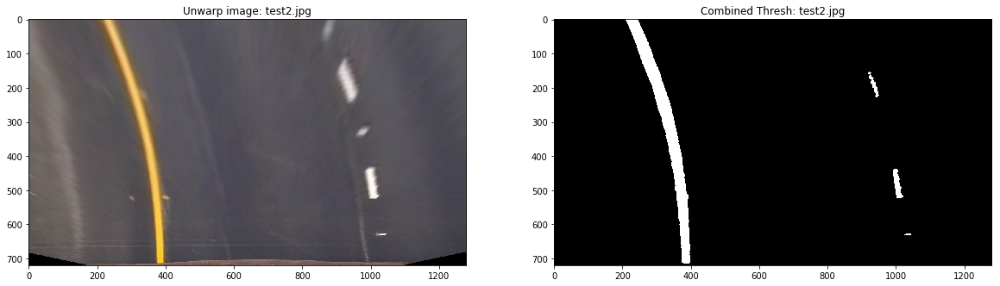

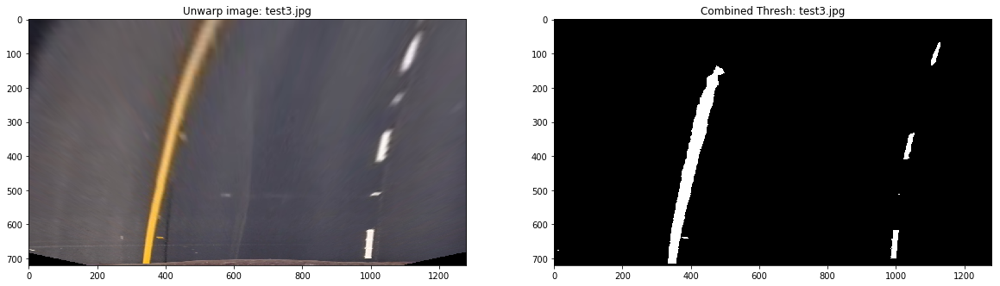

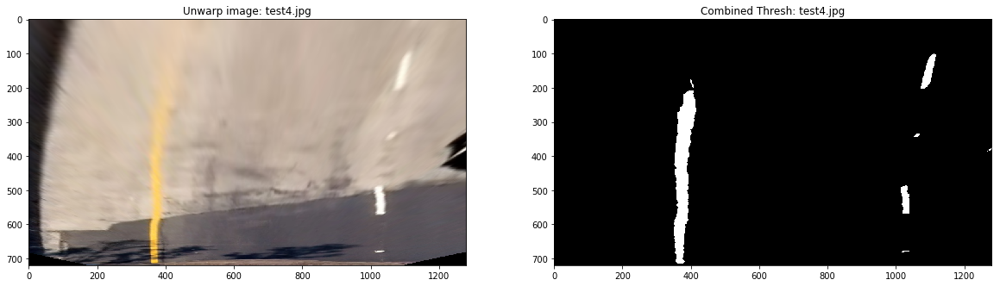

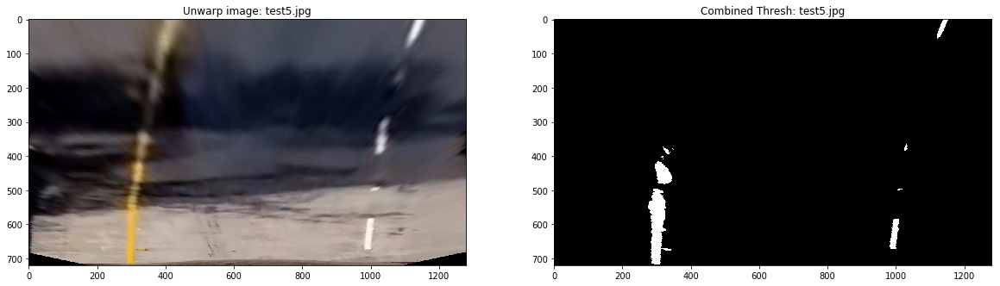

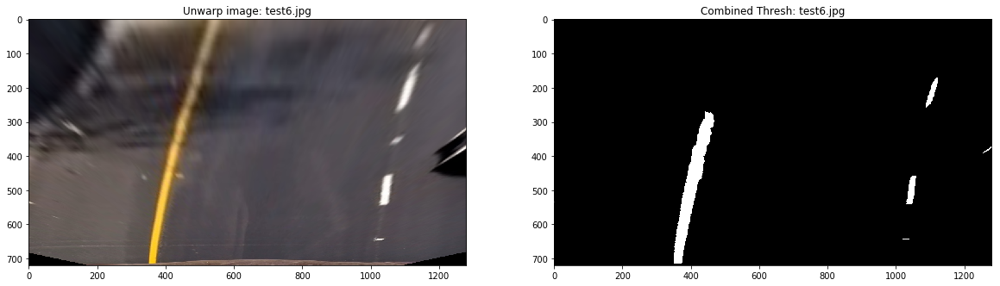

In [8]:
def thresh_img(img,thresh_hls = (220, 255), thresh_lab = (190, 255)):
    ##HLS 
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_l = hls[:,:,1]
    hls_l = hls_l*(255/np.max(hls_l))
    HLS_output = np.zeros_like(hls_l)
    HLS_output[(hls_l > thresh_hls[0]) & (hls_l <= thresh_hls[1])] = 1
    
    ## Lab
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    Lab_output = np.zeros_like(lab_b)
    Lab_output[((lab_b > thresh_lab[0]) & (lab_b <= thresh_lab[1]))] = 1
    
    ## combine both channel(Lab_output == 1)
    combined_binary = np.zeros_like(Lab_output)
    combined_binary[(HLS_output == 1) | (Lab_output == 1)] = 1
    return combined_binary

for image in images :
    img = mpimg.imread("test_images/" + image)
    undist = undistort(img)
    unwarp, _, _ = unwarped(img, undist)
    combined_binary = thresh_img(unwarp)
    mpimg.imsave(os.path.join('output_images', "combined_binary_" + image), combined_binary)
    # Plotting thresholded images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Unwarp image' + ': ' + image)
    ax1.imshow(unwarp)
    
    ax2.set_title('Combined Thresh' + ': ' + image)
    ax2.imshow(combined_binary, cmap='gray')

# Process Pipline

In [9]:
def pipeline(img):
    undist = undistort(img)
    unwarp, M, Minv = unwarped(img, undist)
    combined_binary = thresh_img(unwarp)
    return combined_binary, Minv

# Find Line With Window Method

In [10]:
def window_line(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    rectangle_data = []
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high)\
                          & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) \
                           & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    left_fit, right_fit = (None, None)
    
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
        
    return left_fit, right_fit, left_lane_inds, right_lane_inds, rectangle_data

(720, 0)

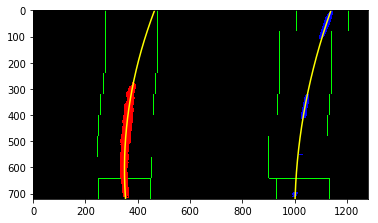

In [11]:
## plot the windowed Image
img = cv2.imread('./test_images/test1.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
combined_binary, Minv = pipeline(img)
left_fit, right_fit, left_lane_inds, right_lane_inds, rectangle_data = window_line(combined_binary)

out_img = np.uint8(np.dstack((combined_binary, combined_binary, combined_binary))*255)
ploty = np.linspace(0, combined_binary.shape[0]-1, combined_binary.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
for rect in rectangle_data:
    cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
    cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
    
# Identify the x and y positions of all nonzero pixels in the image
nonzero = combined_binary.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

# New Fit Based On Before

In [12]:
# this assumes that the fit will not change significantly from one video frame to the next
def New_fit(binary_warped, left_fit_prev, right_fit_prev):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
        
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

(720, 0)

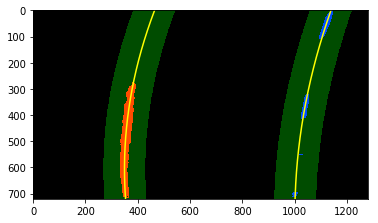

In [13]:
# visualize the result on example image
img = cv2.imread('./test_images/test1.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
binary_warped, Minv = pipeline(img)   
margin = 80

left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = New_fit(binary_warped, left_fit, right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]

# Create an image to draw on and an image to show the selection window
out_img = np.uint8(np.dstack((binary_warped,binary_warped, binary_warped))*255)
window_img = np.zeros_like(out_img)

# Color in left and right line pixels
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area (OLD FIT)
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

# Curvature and Distance From Center

In [37]:
def curvature_and_distance(binary_img, l_fit, r_fit, l_lane_inds, r_lane_inds):

    # Define y-value where we want radius of curvature
    ploty = np.linspace(0, binary_img.shape[0] - 1, binary_img.shape[0])
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    ## meters per pixel in y dimension
    left_c = l_fit[0] * binary_img.shape[0] ** 2 + l_fit[1] * binary_img.shape[0] + l_fit[2]
    right_c = r_fit[0] * binary_img.shape[0] ** 2 + r_fit[1] * binary_img.shape[0] + r_fit[2]
    width = right_c - left_c
    xm_per_pix = 3.7 / width
    
    ym_per_pix = 3*7/720 # meters per pixel in y dimension.
    
    left_curverad = 0
    right_curverad = 0 
    center_dist = 0
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) \
        / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) \
        / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = binary_img.shape[1]/2
        l_fit_x_int = l_fit[0]*binary_img.shape[0]**2 + l_fit[1]*binary_img.shape[0] + l_fit[2]
        r_fit_x_int = r_fit[0]*binary_img.shape[0]**2 + r_fit[1]*binary_img.shape[0] + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist

cur_left, cur_right, center_dist = curvature_and_distance(combined_binary, left_fit, right_fit, \
                                                          left_lane_inds, right_lane_inds)

print('Radius of curvature = ', cur_left, '(m),', cur_right, '(m)')
print('Distance from lane center = ', center_dist, '(m)')

Radius of curvature =  238.427605991 (m), 331.572349644 (m)
Distance from lane center =  -0.214762597379 (m)


# Draw Lines Back to Orignal Image

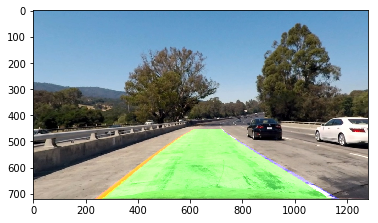

In [38]:
def draw_lane(img, binary_img, l_fit, r_fit, Minv):
    new_img = np.copy(img)
    new_img = undistort(new_img)
    if l_fit is None or r_fit is None:
        return new_img
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    ploty = np.linspace(0, binary_img.shape[0]-1, binary_img.shape[0])
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,0), thickness=20)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,0,255), thickness=20)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (binary_img.shape[1], binary_img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result

img_new = undistort(img)
img_out1 = draw_lane(img_new, combined_binary, left_fit, right_fit, Minv)
plt.imshow(img_out1)

# Draw Curvature and Distance back to Original Image

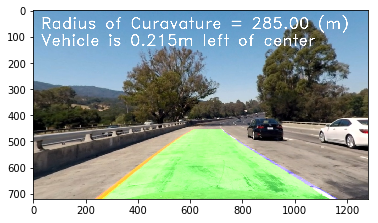

In [39]:
def draw_cur_dist(img, curvature, center_dist):
    new_img = np.copy(img)
    new_img = undistort(new_img)
    ## add curvature
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Radius of Curavature = ' + '{:04.2f}'.format(curvature) + ' (m)'
    cv2.putText(new_img, text, (30,70), font, 2, (255,255,255), 2, cv2.LINE_AA)
    ## add distance 
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    text = 'Vehicle is ' +'{:04.3f}'.format(abs(center_dist)) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (30,135), font, 2, (255,255,255), 2, cv2.LINE_AA)
    return new_img

img_out2 = draw_cur_dist(img_out1, (cur_left + cur_right) / 2, center_dist)
plt.imshow(img_out2)

# Define A Class and Store Data

In [40]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    def fit_line(self, fit, inds):
        if fit is not None:
            if self.best_fit is not None:
                # if there is a best fit, compare with the new fit 
                self.diffs = abs(fit - self.best_fit)
            if (self.diffs[0] > 0.001 or self.diffs[1] > 1.0 or self.diffs[2] > 150.) and len(self.current_fit) > 0:
                #ignore the line
                self.detected = False
            else:
                ## find the best fit
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 3:
                    # keep the lastest fit 
                    self.current_fit = self.current_fit[len(self.current_fit)-3:]
                self.best_fit = np.average(self.current_fit, axis=0)

        else:
            self.detected = False
            if len(self.current_fit) > 0:
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                self.best_fit = np.average(self.current_fit, axis=0)


In [41]:
def process_image(img):
    new_img = np.copy(img)
    binary_warp, Minv = pipeline(new_img)
    
    if l_line.detected == False or r_line.detected == False:
        l_fit, r_fit, l_lane_inds, r_lane_inds, _ = window_line(binary_warp)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = New_fit(binary_warp, l_line.best_fit, r_line.best_fit)
            
    l_line.fit_line(l_fit, l_lane_inds)
    r_line.fit_line(r_fit, r_lane_inds)
    
    ## check the best fit and draw back onto the image
    if l_line.best_fit is not None and r_line.best_fit is not None:
        img_output = draw_lane(new_img, binary_warp, l_line.best_fit, r_line.best_fit, Minv)
        cur_left, cur_right, center_dist = curvature_and_distance(binary_warp, l_line.best_fit, r_line.best_fit, 
                                                               l_lane_inds, r_lane_inds)
        result = draw_cur_dist(img_output, ((cur_left + cur_right) / 2), center_dist)
    else:
        result = new_img
        
    return result

# Process Video

In [42]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [43]:
l_line = Line()
r_line = Line()
video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [04:31<00:00,  4.74it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 4min 55s, sys: 37.6 s, total: 5min 32s
Wall time: 4min 32s


In [44]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output1))

# Process Challenge Video

In [45]:
l_line = Line()
r_line = Line()
video_output2 = 'challenge_video_output.mp4'
video_input2 = VideoFileClip('challenge_video.mp4')
processed_video = video_input2.fl_image(process_image)
%time processed_video.write_videofile(video_output2, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [01:36<00:00,  4.87it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 1min 49s, sys: 11.5 s, total: 2min 1s
Wall time: 1min 37s


In [46]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output2))

# Process Harder Challenge Video

In [47]:
l_line = Line()
r_line = Line()
video_output3 = 'harder_challenge_video_output.mp4'
video_input3 = VideoFileClip('harder_challenge_video.mp4')
processed_video = video_input3.fl_image(process_image)
%time processed_video.write_videofile(video_output3, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████▉| 1199/1200 [04:47<00:00,  4.40it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 5min 5s, sys: 36 s, total: 5min 41s
Wall time: 4min 49s


In [48]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output3))